# AIDM7330 Basic Programming for Data Science

# pillow
Reference: [Pillow](https://python-pillow.org/)

In [ ]:
# Install library using pip package in the current Jupyter kernel
#import sys
#!{sys.executable} -m pip install pillow

In [1]:
from google.colab import drive
drivePath = '/content/drive' #please do not change
drive.mount(drivePath)

Mounted at /content/drive


In [2]:
#pillow image manipulation library
from PIL import Image

#display funtion to present the image inline in Jupyter
from IPython.display import display

#path to figures directory
figuresPath = '/content/drive/MyDrive/Colab Notebooks/figures/'

In [3]:
import os, pathlib
if not(os.path.exists(figuresPath)):
  # os.mkdir(dataPath) # Creates only the last directory if missing. Rises error if it exists
  path = pathlib.Path(figuresPath)
  path.mkdir(parents=True, exist_ok=True) # Can create the folders in the path if missing. No error if path exists
else:
  print('The data path you selected already exists')

The data path you selected already exists


### Image credits
- rm_unsplash.ppm from [Unsplash](https://unsplash.com/photos/AQUNyLTrFsA):
photo by [Roman Melnychuk](https://unsplash.com/@chamooomile0)

In [4]:
# Install the library on your environment
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=256031fb04b9c9e4cd37bdf70f2d6b504fc7fd8995f15176fd53479afc823611
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


In [5]:
# Import the library
import wget

# Setup URL and path variables
baseURL = 'https://raw.githubusercontent.com/pmengoni/AIDM7330-2223S1/main/'
imageName = 'rm_unsplash'
imageExt = '.ppm'
doc = imageName + imageExt
fullURL = baseURL + doc

# Download the file
fileName = wget.download(fullURL, out=figuresPath)

# Print the file name including the local path
print(fileName)

/content/drive/MyDrive/Colab Notebooks/figures//rm_unsplash.ppm


In [6]:
im = Image.open(fileName)

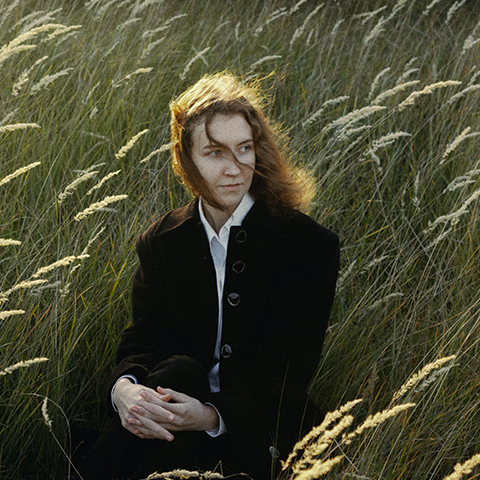

In [7]:
#display an image inline
display(im)

In [8]:
#image features
print(im.format, im.size, im.mode)#ppm:standard for save img

PPM (480, 480) RGB


# thumbnail() and resize()

`thumbnail()` creates a reduced version of the original image.
Thumbnail mantains the aspect ratio, the size we specify is the maximum for each axis.
Thumbnail can be used also to resize the original image, if we don't copy to another one as it works INPLACE.

`resize()` instead doesn't maintain the aspect ratio. It will stretch or reduce the image to fit the specified size.

always 1x1 image

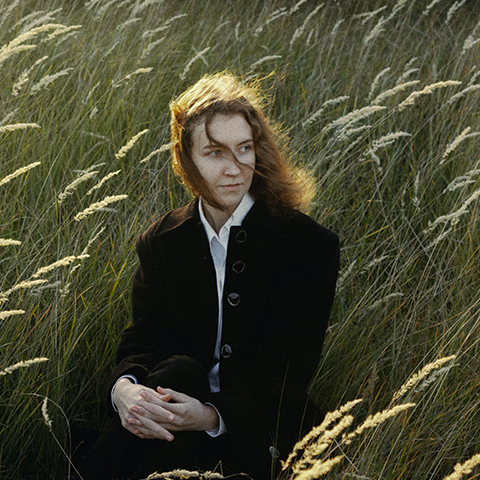

In [9]:
#create a thumbnail and save it as JPEG to a new file
thumbName = imageName + '_thumb'
thumbExt = '.jpg'
thumbFullName = figuresPath + thumbName + thumbExt

#set size of thumbnail
size = (20, 20)

#copy the original image to a working image
thumb = im.copy()#if you don't use the copy,you just give another name
#resize
thumb.thumbnail(size)
#save as JPEG
thumb.save(thumbFullName, format = 'JPEG')
display(im, thumb)

# Cutting, pasting, and merging images
The `Image` class contains methods allowing you to manipulate regions within an image. To extract a sub-rectangle from an image, use the `crop()` method.

A region is defined by a 4-tuple, where coordinates are (left, upper, right, lower). The Python Imaging Library uses a coordinate system with (0, 0) in the upper left corner. Also note that coordinates refer to positions between the pixels, so the region in the below example is exactly 60x60 pixels.

When pasting you can use a 2-tuple or 4-tuple:
* A 2-tuple identifies the top left corner where to paste in the destination image
* A 4-tuple defines the left, upper, right, and lower pixel coordinate. The pasted pixel should be the same size of what defined by the tuple

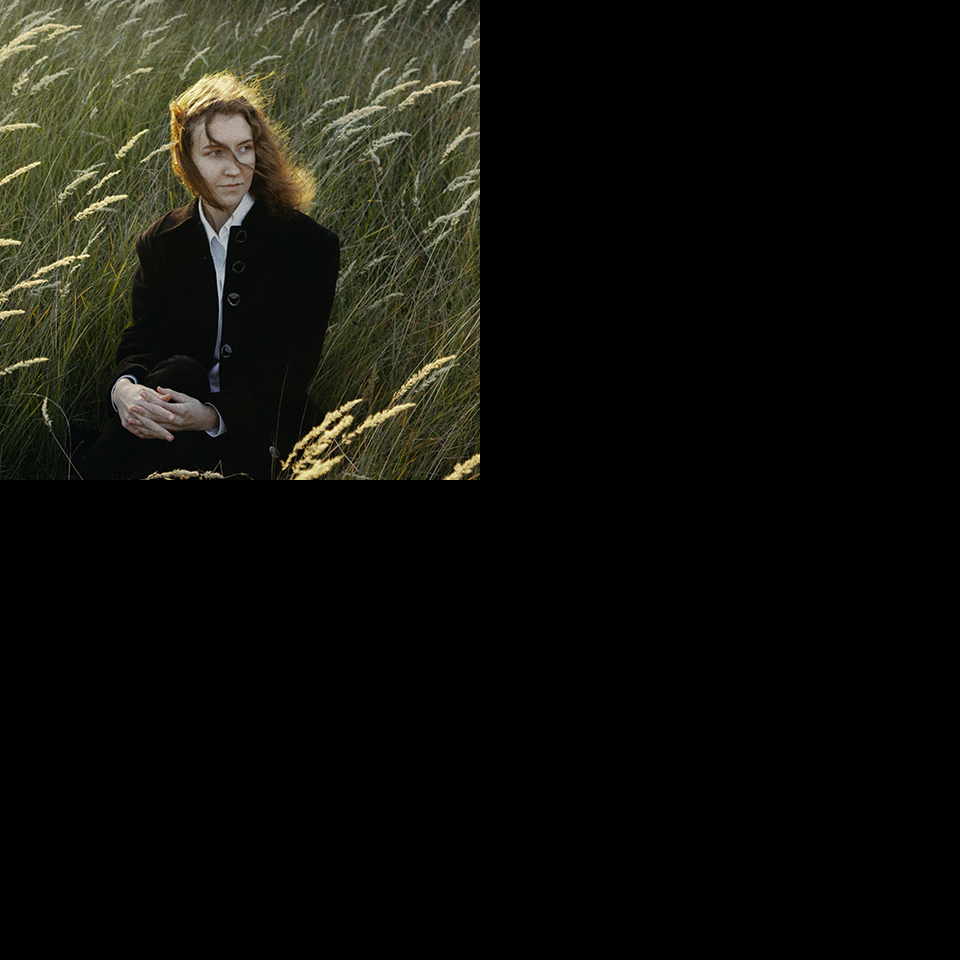

In [10]:
xsize, ysize = im.size#extract the original size
xsizeNew = xsize * 2
ysizeNew = ysize * 2

newIm = Image.new(mode = 'RGB', size = (xsizeNew, ysizeNew), color = 0#0:black)
newIm.paste(im, (0,0))
display(newIm)

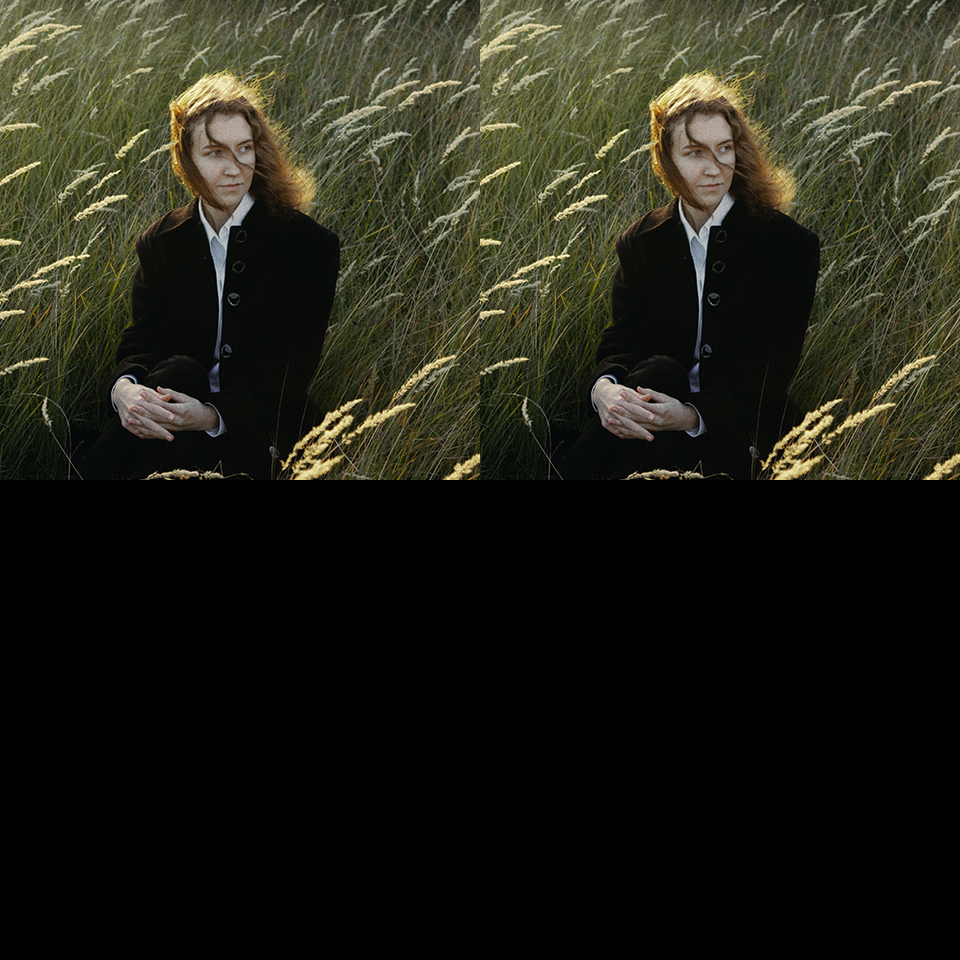

In [11]:
newIm.paste(im, (xsize,0))#position
display(newIm)

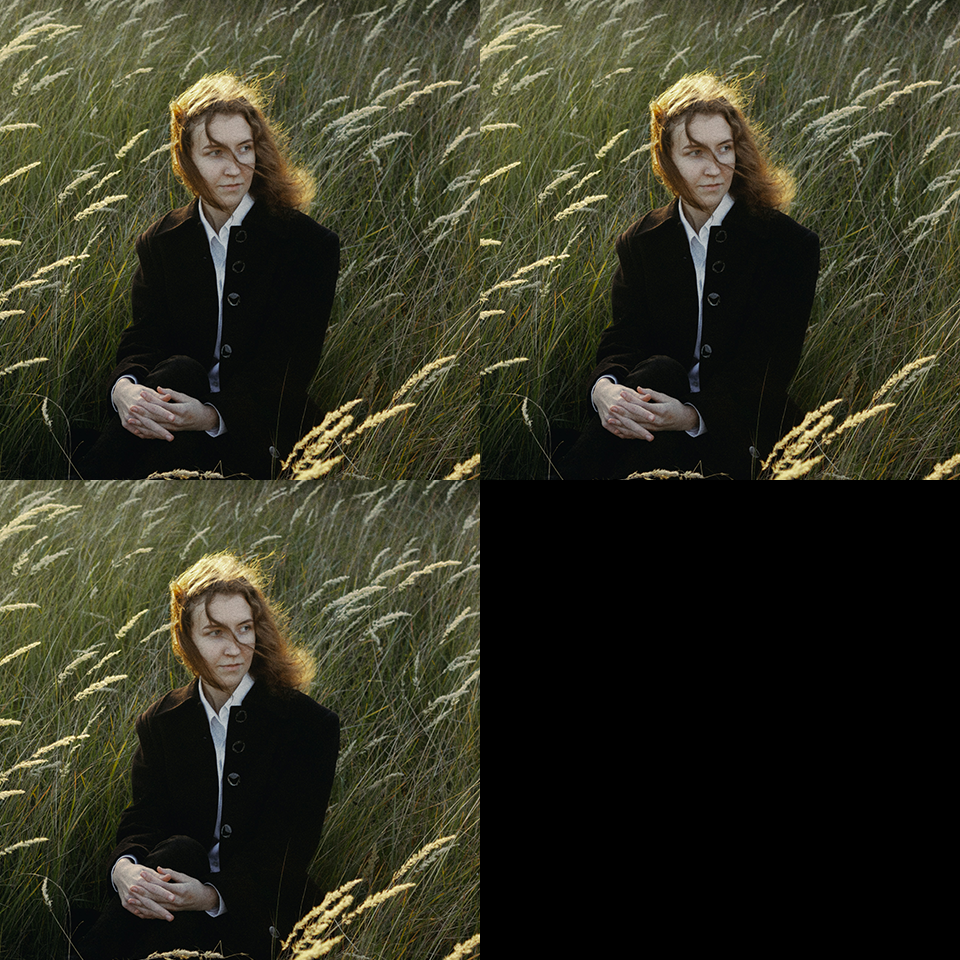

In [12]:
newIm.paste(im, (0,ysize))
display(newIm)

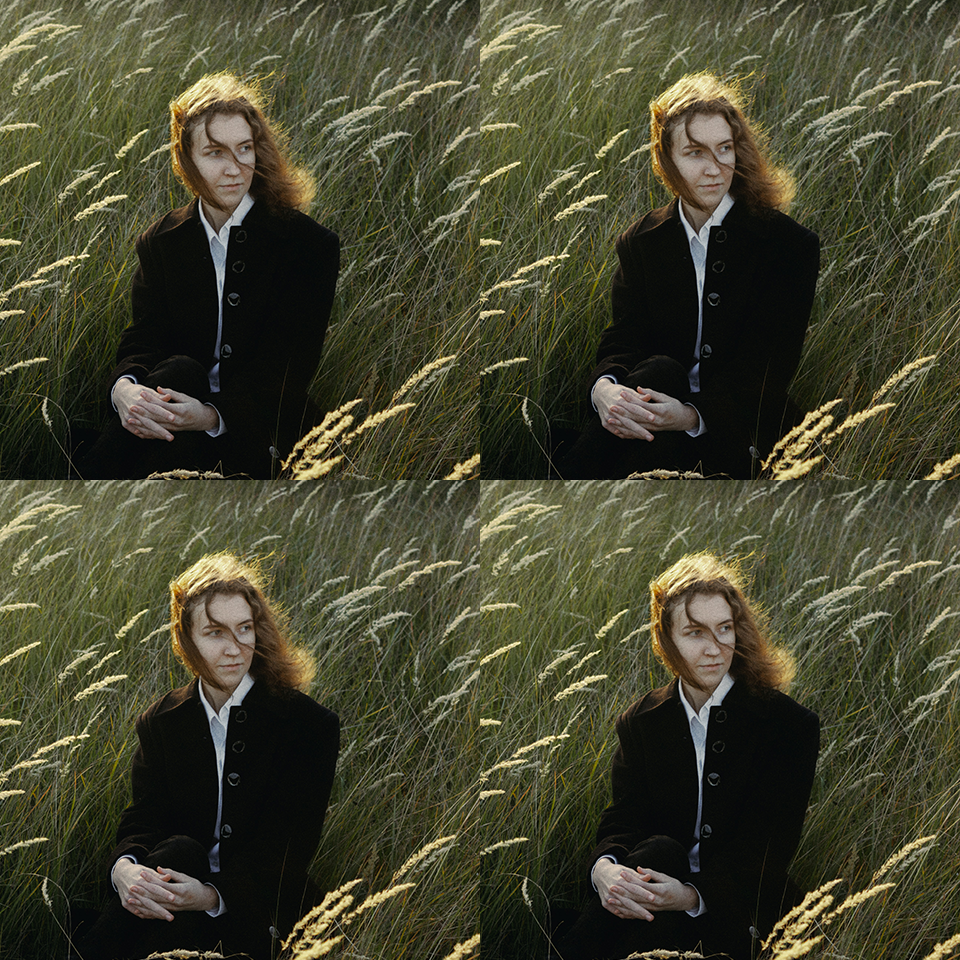

In [13]:
newIm.paste(im, (xsize,ysize))
display(newIm)

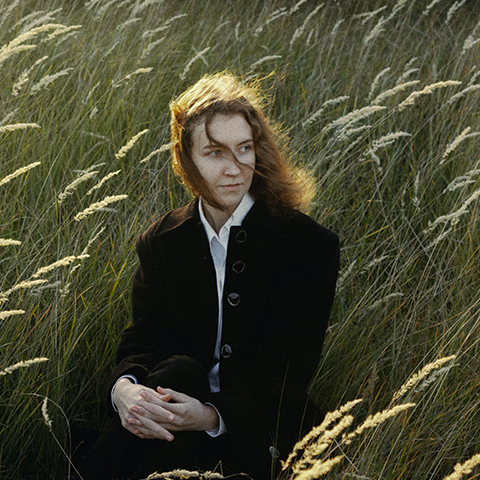

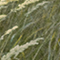

In [14]:
#make a work copy
imTmp = im.copy()

#select a box
box = (30, 30, 90, 90)
region = imTmp.crop(box)#cut-crop
display(im, region)

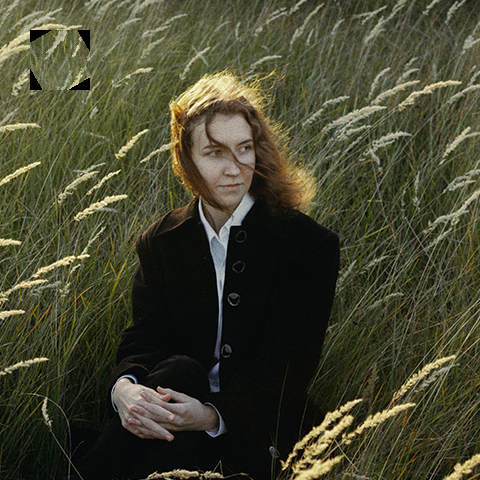

In [15]:
region = region.rotate(210)
imTmp.paste(region, box)
display(imTmp)

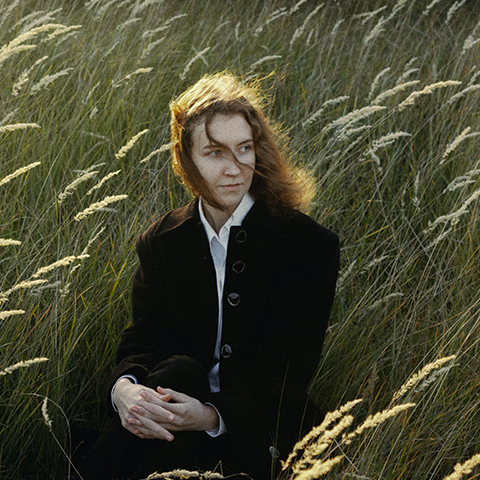

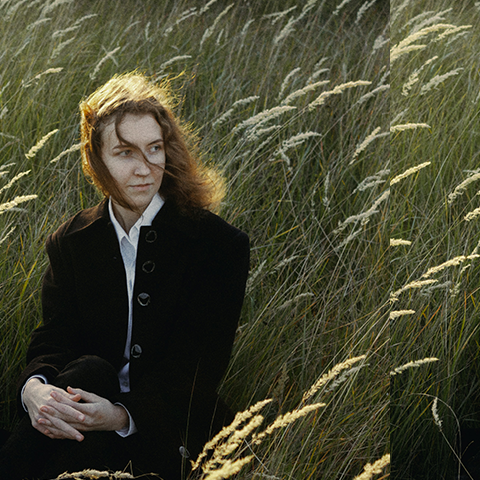

In [16]:
def roll(image, delta):
    #Roll an image sideways.

    #Get image size (two dimensions in one line)
    xsize, ysize = image.size

    #if delta is multiple of image size, do nothing
    delta = delta % xsize
    if delta == 0: return image

    #crop the two image parts
    part1 = image.crop((0, 0, delta, ysize))
    part2 = image.crop((delta, 0, xsize, ysize))

    #past them in inverted positions
    image.paste(part1, (xsize-delta, 0, xsize, ysize))
    image.paste(part2, (0, 0, xsize-delta, ysize))

    return image

#test
rolledImage = im.copy()
rolledImage = roll(rolledImage, 90)
display(im, rolledImage)

# Geometrical Transformation
`resize()` method rotates an image counter-clockwise by a certain number of degrees
`transpose()` method flips horizontally and vertically an image. Can also rotate the image in steps of 90 degrees, using the following parameters: `Image.FLIP_LEFT_RIGHT`, `Image.FLIP_TOP_BOTTOM`, `Image.ROTATE_90`, `Image.ROTATE_180`, Image.`ROTATE_270`

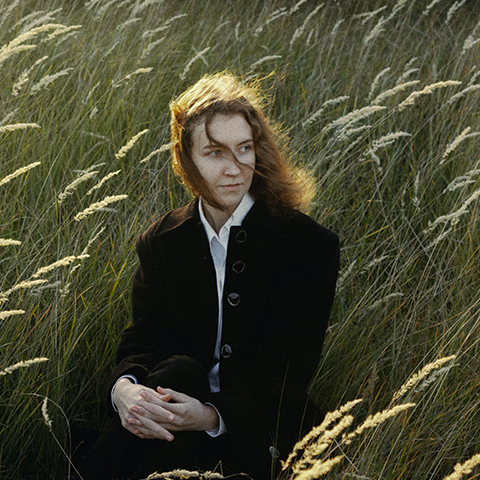

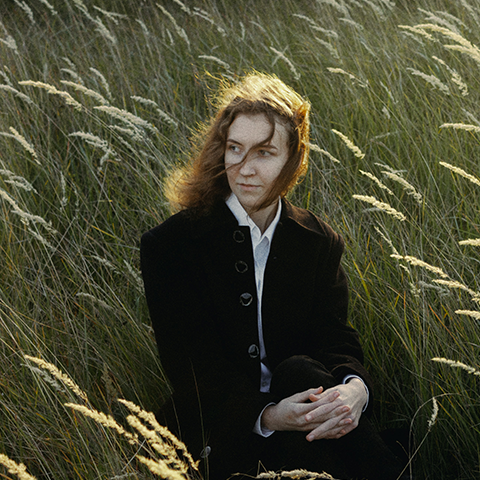

In [17]:
imTmp = im.copy()
imTransposed = imTmp.transpose(Image.FLIP_LEFT_RIGHT)
display(im, imTransposed)

# Filters
The `ImageFilter` module contains a number of pre-defined enhancement filters that can be used with the `filter()` method.

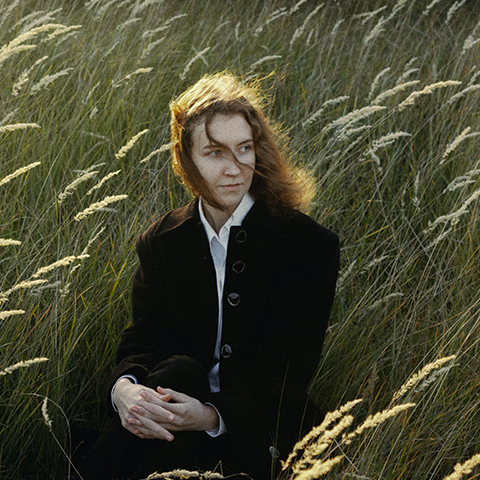

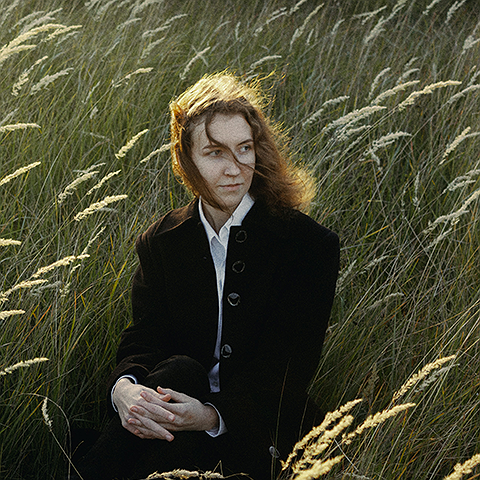

In [18]:
from PIL import ImageFilter

#apply the DETAIL filter to enhance the detail of the image
out = im.filter(ImageFilter.DETAIL)
display(im, out)

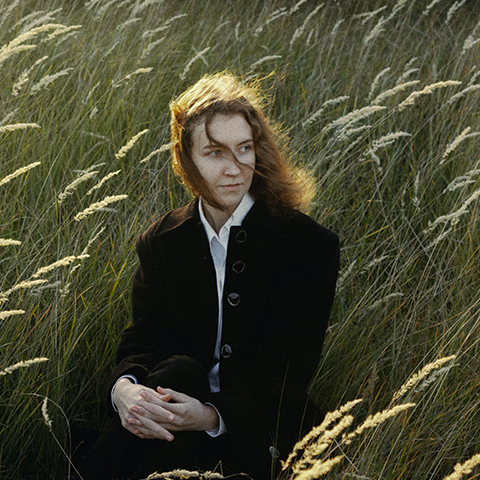

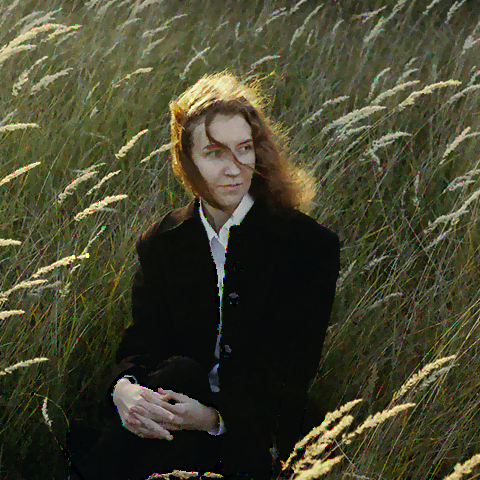

In [19]:
#apply the Mode filter
out = im.filter(ImageFilter.ModeFilter(size=4))
display(im, out)

Filters that can be used:

* BLUR
* CONTOUR
* DETAIL
* EDGE_ENHANCE
* EDGE_ENHANCE_MORE
* EMBOSS
* FIND_EDGES
* SMOOTH
* SMOOTH_MORE
* SHARPEN

and more in the [documentation](https://pillow.readthedocs.io/en/3.0.x/reference/ImageFilter.html)


# Enhancement

For more advanced image enhancement, you can use the classes in the `ImageEnhance` module. Function `Color()`, `Contrast()`, `Brightness()` and `Sharpness()` improve different aspects of the image.

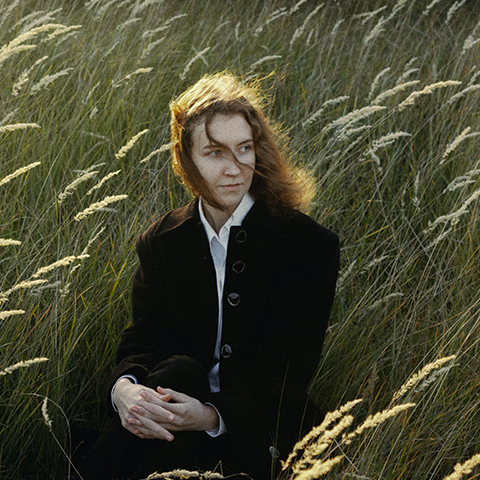

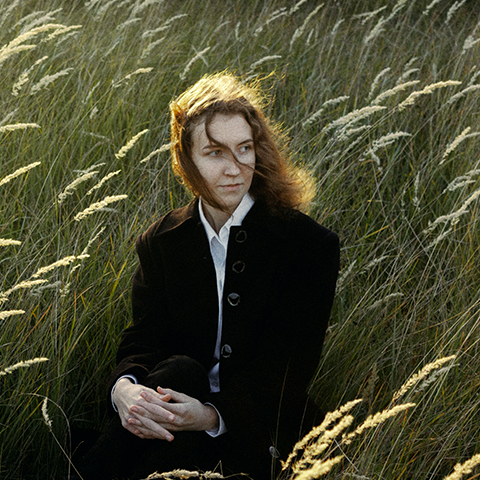

In [20]:
from PIL import ImageEnhance

enh = ImageEnhance.Contrast(im)
factor = 1.1
tmpImg = enh.enhance(factor)
display(im, tmpImg)

# Color conversion
Color mode can be converted using the `convert()` method of the `Image`.
Supported modes are:
* `1` (1-bit pixels, black and white, stored with one pixel per byte)
* `L` (8-bit pixels, black and white)
* `P` (8-bit pixels, mapped to any other mode using a color palette)
* `RGB` (3x8-bit pixels, true color)
* `RGBA` (4x8-bit pixels, true color with transparency mask)
* `CMYK` (4x8-bit pixels, color separation)
* `YCbCr` (3x8-bit pixels, color video format)
* `LAB` (3x8-bit pixels, the L*a*b color space)
* `HSV` (3x8-bit pixels, Hue, Saturation, Value color space)
* `I` (32-bit signed integer pixels)
* `F` (32-bit floating point pixels)

Most commonly used are black and white `1`, grey scale `L`, red/green/blue `RGB`.

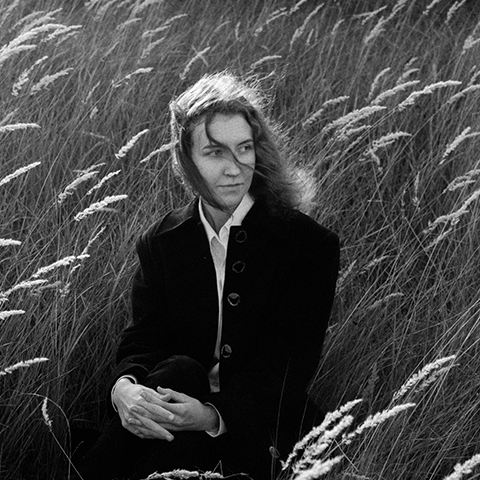

In [21]:
tmpImg = tmpImg.convert('L')
display(tmpImg)
#arr = np.array(tmpImg)
#print(arr)

# Pillow to NumPy
important

In [22]:
#convert a pillow image to a numpy array
import numpy as np
npImage = np.array(im)
print('Image shape', npImage.shape) #returns x, y, numDimensions

Image shape (480, 480, 3)


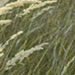

In [25]:
#npImage = npImage - 25
npSlice = npImage[25:100,25:100,]
npSliceR = npSlice[:,1]
#print(npSliceR)#distribute RGB
#npSliceG = npSlice[:,2]
#npSliceB = npSlice[:,3]#take the blue column slice
#print('Image shape', npSlice.shape)
#xSize, ySize, channels = npSlice.shape
#npSlice[:,1] = np.zeros((xSize, channels), dtype=int)
newImage = Image.fromarray(npSlice)
display(newImage)

In [24]:
print(npSlice[:,:,1])#print as matrix

[[164 163 138]
 [187 180 158]
 [183 178 154]
 [186 181 156]
 [172 169 144]
 [175 171 144]
 [174 171 141]
 [199 192 156]
 [243 233 189]
 [234 223 177]
 [215 204 153]
 [213 202 151]
 [209 197 152]
 [204 198 158]
 [160 163 117]
 [102 105  55]
 [113 112  68]
 [124 125  82]
 [116 119  75]
 [124 133  89]
 [198 193 152]
 [241 221 185]
 [195 186 143]
 [188 181 121]
 [170 169 113]
 [123 125  78]
 [109 112  68]
 [113 117  75]
 [115 121  73]
 [139 138  84]
 [140 137  86]
 [ 95  98  57]
 [ 94  96  52]
 [117 117  73]
 [116 118  83]
 [104 107  75]
 [ 97 100  65]
 [ 97 101  64]
 [ 87  93  49]
 [ 84  90  45]
 [ 95  99  58]
 [ 95  98  62]
 [103 105  73]
 [136 138 108]
 [158 163 135]
 [110 120  95]
 [120 128 101]
 [171 171 139]
 [200 189 149]
 [226 209 173]
 [210 198 167]
 [139 143  99]
 [ 93 100  57]
 [185 177 144]
 [229 213 178]
 [206 197 154]
 [146 145 102]
 [117 117  77]
 [130 128  96]
 [110 110  84]
 [119 116  90]
 [123 119  87]
 [110 109  71]
 [ 89  88  49]
 [ 86  86  51]
 [ 85  86  54]
 [ 92  93 